# Word statistic

In [220]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [221]:
import string
import re

In [222]:
from schrutepy import schrutepy 

In [223]:
import nltk
from nltk.corpus import stopwords

stop_words = list(set(stopwords.words('english')))

In [284]:
pd.set_option('display.max_rows', None) 

# Import scripts

In [224]:
script_w = schrutepy.load_schrute()

In [225]:
def schrut_prep(df):
    df.drop(columns=['index'], axis=1, inplace=True)

    df.drop(df[df.text_w_direction.isna()].index, axis=0, inplace=True)
    
    df.rename(columns={'episode_name':'title','text_w_direction':'text_w'},inplace=True)
    
    return df

In [226]:
script_w = schrut_prep(script_w)

In [227]:
script = script_w.dropna()

In [228]:
script.head()

,season,episode,title,director,writer,character,text,text_w
0,1,1,Pilot,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,Michael,All right Jim. Your quarterlies look very good...,All right Jim. Your quarterlies look very good...
1,1,1,Pilot,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,Jim,"Oh, I told you. I couldn't close it. So...","Oh, I told you. I couldn't close it. So..."
2,1,1,Pilot,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,Michael,So you've come to the master for guidance? Is ...,So you've come to the master for guidance? Is ...
3,1,1,Pilot,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,Jim,"Actually, you called me in here, but yeah.","Actually, you called me in here, but yeah."
4,1,1,Pilot,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,Michael,"All right. Well, let me show you how it's done.","All right. Well, let me show you how it's done."


# Import episode info

In [229]:
df = pd.read_csv('imdb.csv')

In [230]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186 entries, 0 to 185
Columns: 104 entries, season to director_Jon_Favreau
dtypes: float64(1), int64(100), object(3)
memory usage: 151.2+ KB


In [231]:
df.head()

,season,title,rating,votes,double,episode,month,director,writer,writer_B.J._Novak,...,director_Reginald_Hudlin,director_Craig_Zisk,director_Brian_Baumgartner,director_J.J._Abrams,director_Alex_Hardcastle,director_Kelly_Cantley-Kashima,director_Michael_Spiller,director_Danny_Leiner,director_Asaad_Kelada,director_Jon_Favreau
0,1,Pilot,7.4,7006,0,1,3,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,0,...,0,0,0,0,0,0,0,0,0,0
1,1,Diversity Day,8.3,6902,0,2,3,Ken Kwapis,B.J. Novak,1,...,0,0,0,0,0,0,0,0,0,0
2,1,Health Care,7.7,5756,0,3,4,Ken Whittingham,Paul Lieberstein,0,...,0,0,0,0,0,0,0,0,0,0
3,1,The Alliance,8.0,5579,0,4,4,Bryan Gordon,Michael Schur,0,...,0,0,0,0,0,0,0,0,0,0
4,1,Basketball,8.4,6183,0,5,4,Greg Daniels,Greg Daniels,0,...,0,0,0,0,0,0,0,0,0,0


# Functions to work with text

In [232]:
# returns bag of words
def prepare_text(text, stop=True):
    words = nltk.word_tokenize(text)

    words=[word.lower() for word in words if word.isalpha()]
    
    if stop:
        words = [w for w in words if not w in stop_words]
    
    return words

In [233]:
def tokenisation(text, stop=True):
    result = []
    
    tokenised = nltk.word_tokenize(text)
    
    for word in tokenised:
        word_low = word.lower()
        
        if word_low not in string.punctuation:
            if word_low not in ['""', '``',"''", "'s", "==", "===","..."]:
                if stop == True:
                    if word_low not in stop_words:
                        result.append(word_low)
                else:
                    result.append(word_low)
    
    return result

In [234]:
def dispersion_plot(text, words, ignore_case=False, title="Lexical Dispersion Plot"):
    """
    Generate a lexical dispersion plot.

    :param text: The source text
    :type text: list(str) or enum(str)
    :param words: The target words
    :type words: list of str
    :param ignore_case: flag to set if case should be ignored when searching text
    :type ignore_case: bool
    
    https://www.nltk.org/_modules/nltk/draw/dispersion.html
    """

    try:
        from matplotlib import pylab
    except ImportError as e:
        raise ValueError(
            "The plot function requires matplotlib to be installed."
            "See https://matplotlib.org/"
        ) from e

    text = list(text)
    words.reverse()

    if ignore_case:
        words_to_comp = list(map(str.lower, words))
        text_to_comp = list(map(str.lower, text))
    else:
        words_to_comp = words
        text_to_comp = text

    points = [
        (x, y)
        for x in range(len(text_to_comp))
        for y in range(len(words_to_comp))
        if text_to_comp[x] == words_to_comp[y]
    ]
    if points:
        x, y = list(zip(*points))
    else:
        x = y = ()
    pylab.plot(x, y, "b|", scalex=0.1)
    pylab.yticks(list(range(len(words))), words, color="b")
    pylab.ylim(-1, len(words))
    pylab.title(title)
    pylab.xlabel("Word Offset")
    pylab.show()


# Prepare bag of word

In [235]:
text_row_all = ' '.join( word for word in script.text)

In [236]:
bow_without_stop = prepare_text(text_row_all,stop=True)
bow_all = prepare_text(text_row_all,stop=False)

# Count words in episode
without stopword cleaning

In [237]:
df['words'] = 0

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text)
        
        text = prepare_text(text_row,stop=False)
        
        df.loc[(df.season==season) & (df.episode==episode),'words'] = len(text)      
        

<AxesSubplot:xlabel='words', ylabel='Count'>

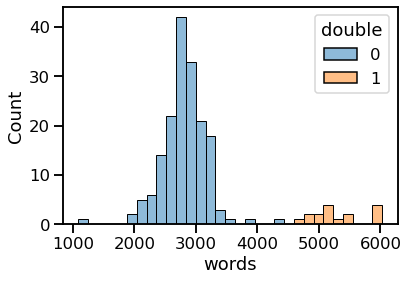

In [238]:
sns.histplot(data=df, x='words', hue='double')

# Most popular words in each episode (tf-idf)
with stopwords,    
using inverse frequency method (A High weight in TF-IDF is reached by a high term frequency(in the given document) and a low document frequency of the term in the whole collection of documents.)

create dictionary with all words (except stop words) in all episodes

In [239]:
all_words = {}

for word in bow_without_stop:
    if word not in all_words:
        all_words.update({word : 0})

for each word: calculate how much episodes contain this word

In [240]:
for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text)
        
        text = prepare_text(text_row, stop=True)
        
        for word in all_words:
            if word in text:
                all_words[word] += 1

In [241]:
all_words

{'right': 186,
 'jim': 181,
 'quarterlies': 1,
 'look': 184,
 'good': 186,
 'things': 158,
 'library': 1,
 'oh': 186,
 'told': 141,
 'could': 184,
 'close': 83,
 'come': 183,
 'master': 24,
 'guidance': 3,
 'saying': 119,
 'grasshopper': 1,
 'actually': 169,
 'called': 125,
 'yeah': 186,
 'well': 186,
 'let': 184,
 'show': 126,
 'done': 135,
 'yes': 184,
 'like': 186,
 'speak': 49,
 'office': 166,
 'manager': 80,
 'please': 172,
 'hello': 140,
 'michael': 146,
 'scott': 91,
 'regional': 43,
 'dunder': 97,
 'mifflin': 95,
 'paper': 114,
 'products': 13,
 'wanted': 145,
 'talk': 158,
 'deal': 104,
 'thank': 181,
 'much': 176,
 'sir': 67,
 'gentleman': 22,
 'scholar': 2,
 'sorry': 179,
 'ok': 107,
 'mistake': 42,
 'woman': 93,
 'talking': 153,
 'low': 26,
 'voice': 34,
 'probably': 127,
 'smoker': 1,
 'way': 182,
 'uh': 182,
 'years': 123,
 'last': 152,
 'four': 99,
 'want': 185,
 'see': 185,
 'entire': 54,
 'floor': 38,
 'kingdom': 3,
 'far': 70,
 'eye': 34,
 'receptionist': 31,
 'pam': 

calculate idf - normilise count of episodes by number of all episodes 

In [242]:
idf = {x: np.log10(188/y) for (x,y) in all_words.items()}

In [243]:
idf

{'right': 0.004644905045763538,
 'jim': 0.016479274394495348,
 'quarterlies': 2.27415784926368,
 'look': 0.009340026254143432,
 'good': 0.004644905045763538,
 'things': 0.0755007623092572,
 'library': 2.27415784926368,
 'oh': 0.004644905045763538,
 'told': 0.12493873660829993,
 'could': 0.009340026254143432,
 'close': 0.355079756887606,
 'come': 0.011706759533250396,
 'master': 0.8939466075520738,
 'guidance': 1.7970365945440174,
 'saying': 0.19861088787114908,
 'grasshopper': 2.27415784926368,
 'actually': 0.04627114465000628,
 'called': 0.17724783625562343,
 'yeah': 0.004644905045763538,
 'well': 0.004644905045763538,
 'let': 0.009340026254143432,
 'show': 0.17378730414611696,
 'done': 0.14382408076867373,
 'yes': 0.009340026254143432,
 'like': 0.004644905045763538,
 'speak': 0.5839617692351662,
 'office': 0.054049761223624794,
 'manager': 0.37106786227173627,
 'please': 0.03862940235613092,
 'hello': 0.1280298135854418,
 'michael': 0.10980499347924277,
 'scott': 0.3151164569425863,


In [244]:
idf['know']

0.004644905045763538

calculating term frequency in each episode and normilising it by idf

In [245]:
# df['popular_word_1'] = np.nan
# df['popular_word_2'] = np.nan
# df['popular_word_3'] = np.nan

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text)
        
        text = prepare_text(text_row, stop=True)
        
        episode_words = {}
        
        # counting each word appearance
        for word in text:
            if word in episode_words:
                episode_words[word] += 1
            else:
                episode_words.update({word : 1})
        
        # normilising each word by its idf
        for word in episode_words:
            episode_words[word] = episode_words[word] * idf[word]
        
        print()
        print(season, episode)
        k = 1
        
        # choosing most popular
        for word in sorted(episode_words, key=episode_words.get, reverse=True):
            print(word, episode_words[word])
            
#             df.loc[(df.season==season) & (df.episode==episode), f'popular_word_{k}'] = word
            
            k += 1
            
            if k > 3:
                break


1 1
downsizing 18.902254139131934
whassup 11.3707892463184
josh 5.096631397054719

1 2
diversity 23.361475729072225
googi 22.7415784926368
hero 10.43708927885406

1 3
health 11.944850979730212
workspace 10.472046192160253
plan 8.941486978377151

1 4
alliance 23.361475729072225
downsizing 14.17669060434895
birthday 11.295298003146957

1 5
saturday 11.879238058419196
foul 8.976039593280216
basketball 8.919104944845758

1 6
katy 17.327066294204272
purses 13.64494709558208
moms 8.360489289678588

2 1
dundies 37.80450827826387
award 25.432112180960615
dundie 11.704685005550022

2 2
lawyer 10.96854289817389
forwards 7.892511414398794
packer 7.490265066254285

2 3
medal 10.782219567264104
mozart 9.09663139705472
bedroom 9.024238508683535

2 4
desert 10.472046192160253
island 9.86212131284364
davinci 9.09663139705472

2 5
halloween 8.919104944845758
devon 8.360489289678588
loyalty 7.145299046247116

2 6
sensei 19.731278535996985
warmer 14.37629275635214
sempai 11.3707892463184

2 7
scarn 15.7


6 13
santa 47.87221116416116
christmas 16.338936508871342
matt 15.785022828797588

6 14
computron 20.46742064337312
electric 12.601502759421289
generally 7.480032994400181

6 15
sabre 18.77287875859355
saber 11.3707892463184
suck 9.347993654269144

6 16
valentine 7.145299046247116
seesaw 6.82247354779104
manager 6.308153658619517

6 17
hospital 17.379809915873224
feast 11.432478473995385
ha 10.265388299311168

6 19
jo 14.98053013250857
patrick 10.782219567264104
dweedle 6.82247354779104

6 20
leads 39.49889332717407
dump 9.55981282572844
warmer 8.985182972720088

6 21
isabel 11.838767121598192
matt 9.865639267998493
julie 9.865639267998493

6 22
secretary 11.28029813585442
cookie 9.882599311871989
yum 9.451127069565967

6 23
minority 14.960065988800363
buenos 11.3707892463184
dias 11.3707892463184

6 24
donna 25.203005518842577
cheating 10.472046192160253
detonator 6.82247354779104

6 25
bum 21.564439134528207
coach 13.464059389920326
donna 12.601502759421289

6 26
printers 13.5604168

# Some intresting words appearane

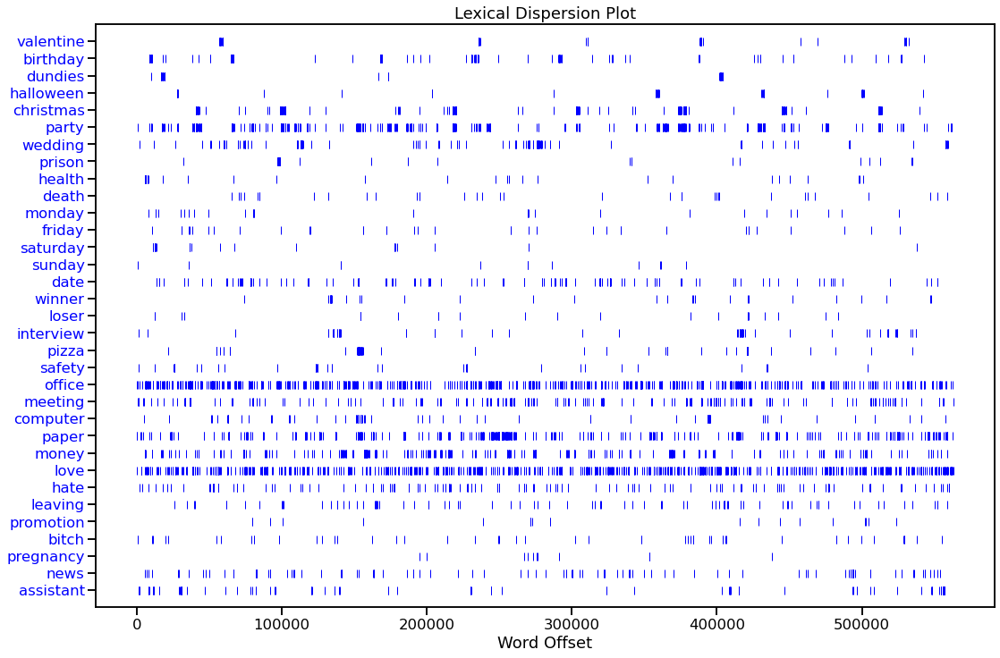

In [246]:
intresting_words = ['valentine','birthday','dundies','halloween',
                    'christmas','party','wedding','prison',
                    'health','death',
                   'monday','friday','saturday',
                   'sunday','date',
                   'winner','loser','interview','pizza','safety',
                    'office','meeting','computer','paper','money','love','hate',
                    'leaving','promotion','bitch','pregnancy','news','assistant']

plt.figure(figsize=(18,12))
dispersion_plot(bow_all,intresting_words,ignore_case=True)

## count appearance of interesting word in each episode

In [247]:
intresting_words = ['valentine','birthday','dundies','halloween',
                    'christmas','party','wedding','death',
                   'monday','friday',
                    'office','meeting','pregnancy']

In [248]:
for word in intresting_words:
    df[word] = np.nan
    
for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text)

        text = prepare_text(text_row, stop=True)
        
        for word in intresting_words:
            df.loc[(df.season==season) & (df.episode==episode),word] = text.count(word)/df[(df.season==season) & (df.episode==episode)].words

In [249]:
sns.set_context('paper',font_scale=1)

df_tmp = df[np.insert(intresting_words,0,'rating')]
df_tmp.corr()['rating'].round(2).sort_values(ascending=False)

rating       1.00
death        0.13
dundies      0.12
christmas    0.11
wedding      0.10
party        0.09
friday       0.01
pregnancy   -0.00
office      -0.03
birthday    -0.03
monday      -0.04
valentine   -0.04
meeting     -0.11
halloween   -0.13
Name: rating, dtype: float64

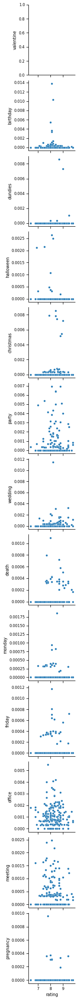

In [250]:
sns.pairplot(data=df_tmp,x_vars=['rating'], y_vars=intresting_words)

# Count words in episode for each character
df[name + '_words'] = how much person says words (in percent )

In [251]:
script.character.value_counts()[:20]

Michael     10877
Dwight       6801
Jim          6268
Pam          5006
Andy         3739
Kevin        1551
Angela       1551
Erin         1431
Oscar        1359
Ryan         1191
Darryl       1177
Phyllis       968
Kelly         835
Toby          813
Jan           807
Stanley       671
Meredith      558
Holly         554
Nellie        527
Gabe          427
Name: character, dtype: int64

In [252]:
characters = script.character.value_counts()[:20].index
characters

Index(['Michael', 'Dwight', 'Jim', 'Pam', 'Andy', 'Kevin', 'Angela', 'Erin',
       'Oscar', 'Ryan', 'Darryl', 'Phyllis', 'Kelly', 'Toby', 'Jan', 'Stanley',
       'Meredith', 'Holly', 'Nellie', 'Gabe'],
      dtype='object')

In [253]:
for person in characters:
    df[person + '_words'] = np.nan

    for season in range(1,10):
        episodes = np.sort(df[df.season==season].episode.unique())

        for episode in episodes: 
            text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode) & (script.character==person)].text)
            
            # do not delete stop words
            text = prepare_text(text_row, stop=False)
            

#             # divide by two for double episode
#             coef = 1
#             if df[(df.season==season) & (df.episode==episode)].double.values == 1:
#                 coef = 2
    
#             df.loc[(df.season==season) & (df.episode==episode),[person + '_words']] = len(text)/coef
        
            total_words = df[(df.season==season) & (df.episode==episode)].words
            df.loc[(df.season==season) & (df.episode==episode),[person + '_words']] = 100*len(text)/total_words

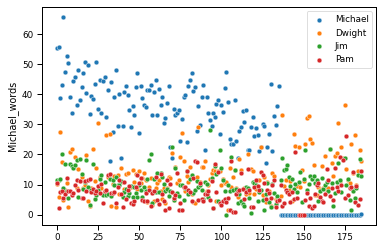

In [254]:
legend=[]
for person in characters[:4]:
    sns.scatterplot(y=df[person + '_words'], x=df.index)
    legend.append(person)
    
plt.legend(legend)

In [255]:
col_name = []
for name in characters:
    col_name.append(name + '_words')

<AxesSubplot:>

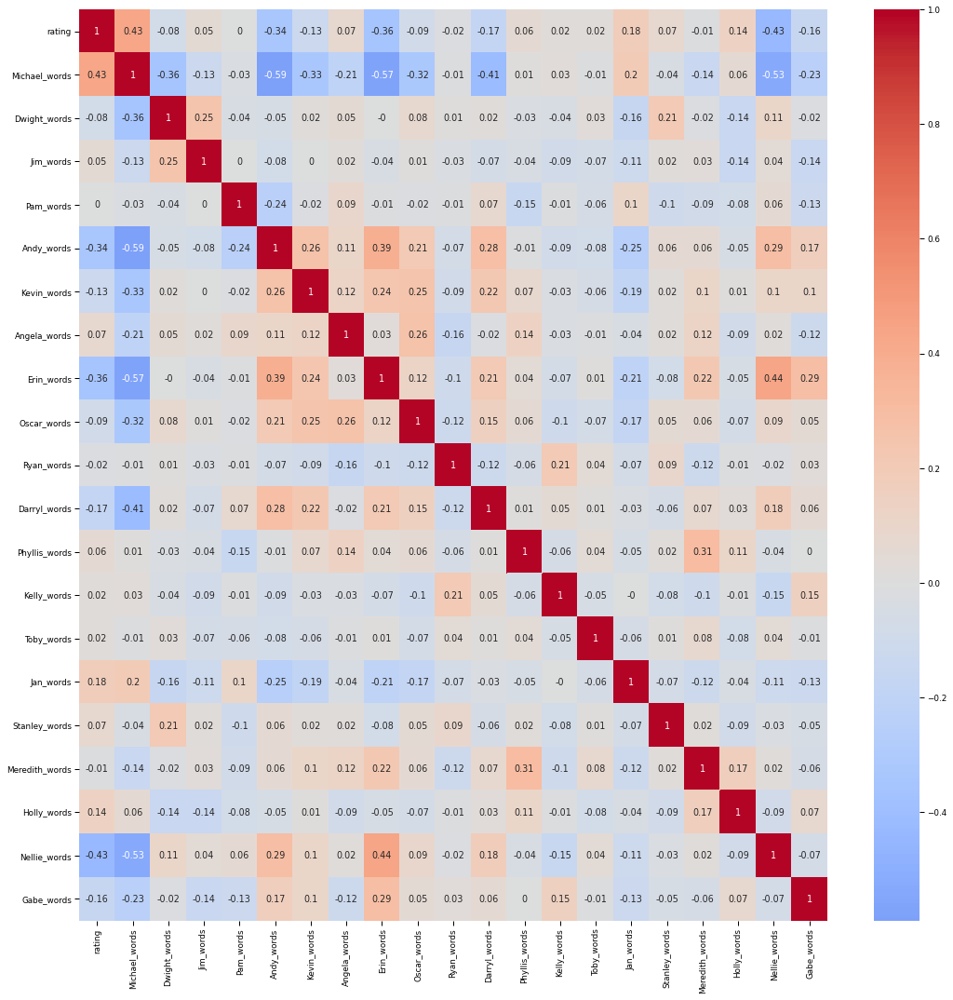

In [256]:
df_tmp = df[np.insert(col_name,0,'rating')]
corr = df_tmp.corr().round(2)

# mask = np.triu(np.ones_like(, dtype=bool))

plt.figure(figsize=(18,18))
sns.heatmap(corr, cmap='coolwarm', center=0,annot=True)

rating has stron correlatio with:   
words    
Michael 
Holly
Andy, Kevin, Arin, Darryl (all of them have negative correlation with Michael)   
Jan (has positive correltion with Michael)



monolog type connections:   
Michael - almost everybody (except Jan)   

dialog type:   
Michael-Jan    
Dwight - Jim
Dwight - Stanley


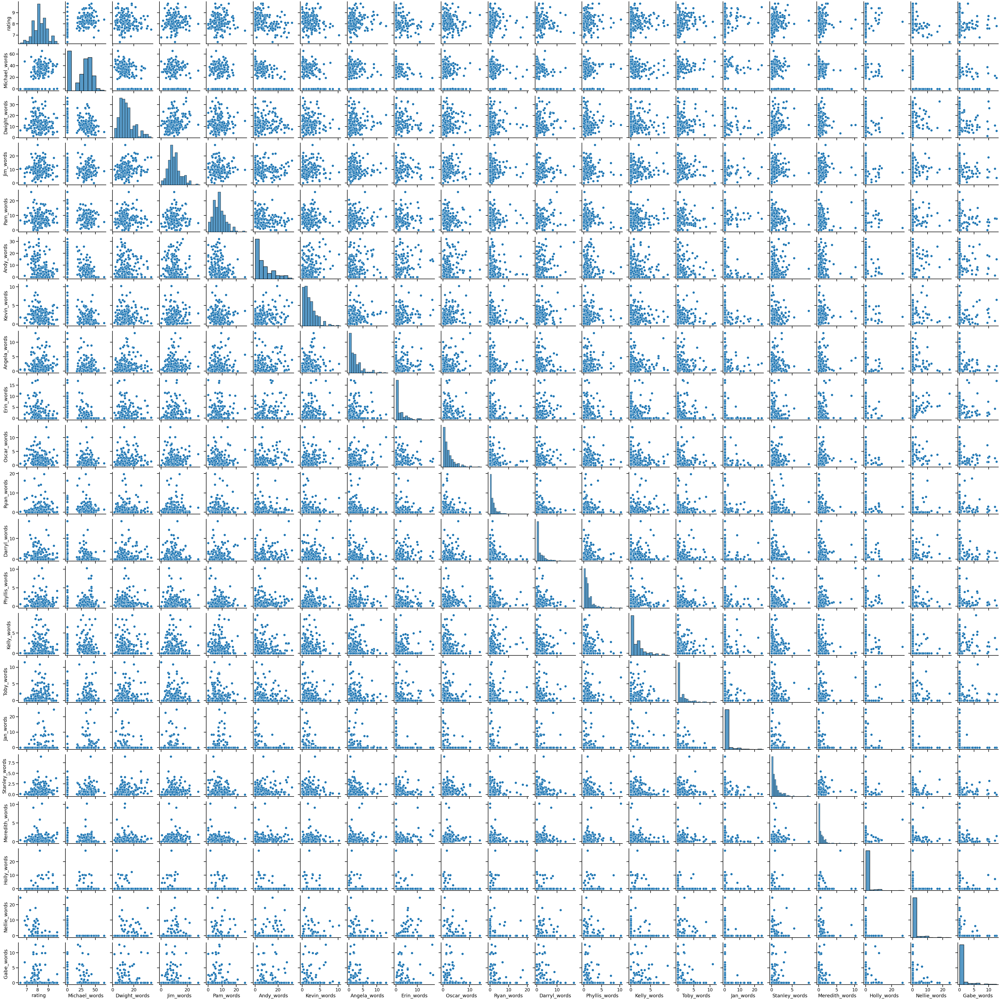

In [257]:
sns.set_context('talk',font_scale=1)
sns.pairplot(df_tmp)

# Character name appearance

In [258]:
characters = ['michael', 'dwight', 'jim', 'pam', 'andy', 'angela', 'kevin', 'erin',
       'oscar', 'ryan', 'darryl', 'phyllis', 'kelly', 'toby', 'jan', 'stanley',
       'meredith', 'holly', 'nellie', 'gabe']

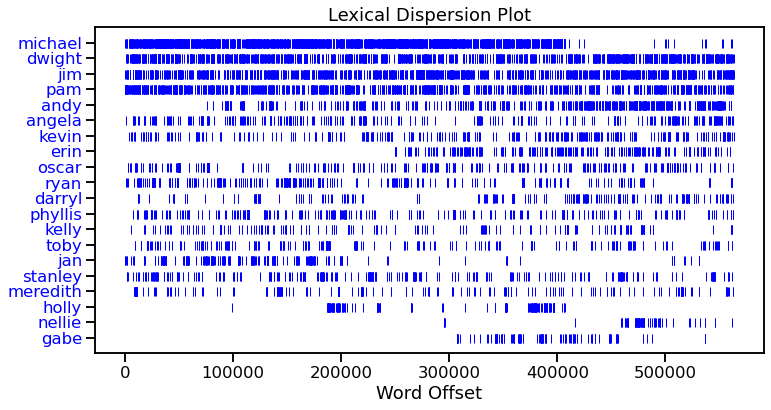

In [259]:
plt.figure(figsize=(12,6))
dispersion_plot(bow_all,characters,ignore_case=True)

In [260]:
# for character in characters:
#     df[character + '_called'] = np.nan
    
# for season in range(1,10):
#     episodes = np.sort(df[df.season==season].episode.unique())

#     for episode in episodes: 
#         text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text)

#         text = prepare_text(text_row, stop=True)
        
#         for character in characters:
#             df.loc[(df.season==season) & (df.episode==episode), [character + '_called']] = text.count(character)

# One person talking about the other

## Jim about Pam

In [261]:
df['Jim_about_Pam'] = 0
df['Jim_about_Dwight'] = 0

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode) & (script.character=='Jim')].text)

        text = prepare_text(text_row, stop=True)
        
        Jim_words =  df[(df.season==season) & (df.episode==episode)].words * df[(df.season==season) & (df.episode==episode)].Jim_words /100
        
        if Jim_words.values != 0:
            df.loc[(df.season==season) & (df.episode==episode),['Jim_about_Pam']] = 100*text.count('pam')/Jim_words
            df.loc[(df.season==season) & (df.episode==episode),['Jim_about_Dwight']] = 100*text.count('dwight')/Jim_words

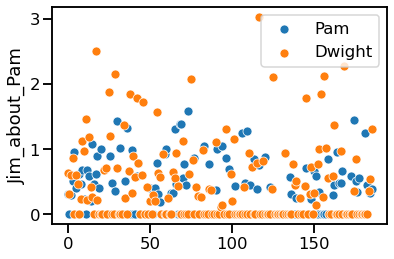

In [262]:
sns.scatterplot(x=df.index, y=df.Jim_about_Pam)
sns.scatterplot(x=df.index, y=df.Jim_about_Dwight)
plt.legend(['Pam','Dwight'])

In [263]:
df[df.Jim_about_Pam.isna()]

,season,title,rating,votes,double,episode,month,director,writer,writer_B.J._Novak,...,Kelly_words,Toby_words,Jan_words,Stanley_words,Meredith_words,Holly_words,Nellie_words,Gabe_words,Jim_about_Pam,Jim_about_Dwight


## Pam about Jim

In [264]:
df['Pam_about_Jim'] = 0
df['Pam_about_Michael'] = 0

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode) & (script.character=='Pam')].text)

        text = prepare_text(text_row, stop=True)
        
        tot_words =  df[(df.season==season) & (df.episode==episode)].words * df[(df.season==season) & (df.episode==episode)].Pam_words /100
        
        if tot_words.values != 0:
            df.loc[(df.season==season) & (df.episode==episode),['Pam_about_Jim']] = 100*text.count('jim')/tot_words
            df.loc[(df.season==season) & (df.episode==episode),['Pam_about_Michael']] = 100*text.count('michael')/tot_words

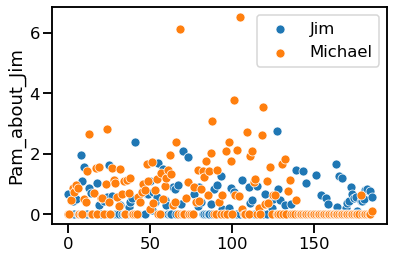

In [265]:
sns.scatterplot(x=df.index, y=df.Pam_about_Jim)
sns.scatterplot(x=df.index, y=df.Pam_about_Michael)
plt.legend(['Jim','Michael'])

## Michael about Jan, Holly

In [266]:
df['Michael_about_Jan'] = 0
df['Michael_about_Holly'] = 0

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode) & (script.character=='Michael')].text)

#         text = prepare_text(text_row, stop=True)
        text = nltk.word_tokenize(text_row)
        
        tot_words =  df[(df.season==season) & (df.episode==episode)].words * df[(df.season==season) & (df.episode==episode)].Michael_words /100
        
        if tot_words.values != 0:
            df.loc[(df.season==season) & (df.episode==episode),['Michael_about_Jan']] = 100*text.count('Jan')/tot_words
            df.loc[(df.season==season) & (df.episode==episode),['Michael_about_Holly']] = 100*text.count('Holly')/tot_words

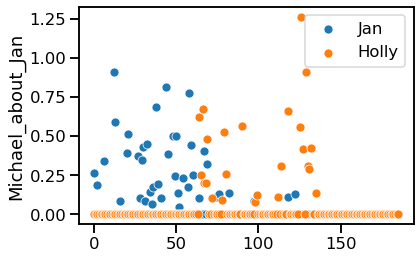

In [267]:
sns.scatterplot(x=df.index, y=df.Michael_about_Jan)
sns.scatterplot(x=df.index, y=df.Michael_about_Holly)
plt.legend(['Jan','Holly'])

# Count dialog
to be honest, i count not only dialog, but all time characters talking together

In [268]:
def print_script_for_episode(script, season, episode):
    script_tmp = script[(script.season==season) & (script.episode==episode)]
    for index in script_tmp.index:
        print()
        print(script_tmp[script_tmp.index==index].character.values)
        print(script_tmp[script_tmp.index==index].text.values)

In [269]:
print_script_for_episode(script, 1, 1)


['Michael']
['All right Jim. Your quarterlies look very good. How are things at the library?']

['Jim']
["Oh, I told you. I couldn't close it. So..."]

['Michael']
["So you've come to the master for guidance? Is this what you're saying, grasshopper?"]

['Jim']
['Actually, you called me in here, but yeah.']

['Michael']
["All right. Well, let me show you how it's done."]

['Michael']
["Yes, I'd like to speak to your office manager, please. Yes, hello. This is Michael Scott. I am the Regional Manager of Dunder Mifflin Paper Products. Just wanted to talk to you manager-a-manger. All right. Done deal. Thank you very much, sir. You're a gentleman and a scholar. Oh, I'm sorry. OK. I'm sorry. My mistake. That was a woman I was talking to, so... She had a very low voice. Probably a smoker, so... So that's the way it's done."]

['Michael']
["I've, uh, I've been at Dunder Mifflin for 12 years, the last four as Regional Manager. If you want to come through here... See we have the entire floor. S

['Oh, Roy.']

['Pam']
['Yeah. Listen, have a nice weekend.']

['Jim']
['Yeah, definitely. You too. Enjoy it. You know what, just come here.']


In [270]:
# create array of names in order of they appearance in script
def who_is_speaking(df, season, episode): 
    script_tmp = df[(df.season==season) & (df.episode==episode)]

    speaking = []
    for index in script_tmp.index:
        speaking.append(script_tmp[script_tmp.index==index].character.values[0])
        
    return speaking

In [273]:
Characters = [name.capitalize() for name in characters]

In [309]:
characters_dialog = []
for name1 in Characters:
    for name2 in Characters[Characters.index(name1)+1:]:
        names = np.sort([name1, name2])
        
        column_name = names[0] + '_' + names[1] + '_dialog'
        df[column_name] = 0
        characters_dialog.append(column_name)


for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        # save all speakers
        speaking = who_is_speaking(script,season, episode)
        
        if len(speaking)==0:
            print('Error! Speaking is empty')
        
        i = 0
        
        while i < len(speaking)- 1:
            names = np.unique(speaking[i:i+2])
#             print('\n-------')
#             print(i)
#             print(names)
            
            # count dialogs only for 20 most talkative characters
            if all([name in Characters for name in names])==False:
                i += 1
                continue
                  
            # check that two different persons speak
            if len(names)==2:
                max_shift = len(speaking) - i
                
                # search for en of dialog
                for shift in range(2,max_shift):
                    new_names = np.unique(speaking[i:i+shift])
#                     print(shift, new_names)
                    
                    #condition to stop search : new name appears
                    if any([name not in names for name in new_names]):
                        break
                
                # save only dialog with 4 replicas
                if shift > 4:
                    names = np.sort(names)
                    key = names[0] + '_' + names[1] + '_dialog'
                    
                    df.loc[(df.season==season) & (df.episode==episode), [key]] += shift-1

                i += shift - 1

            else:
                i += 1

In [317]:
df.sum()[characters_dialog].sort_values(ascending=False)

Dwight_Michael_dialog      2261
Jim_Pam_dialog             1677
Dwight_Jim_dialog          1247
Michael_Pam_dialog         1136
Jim_Michael_dialog         1041
Jan_Michael_dialog          712
Andy_Erin_dialog            438
Andy_Dwight_dialog          431
Holly_Michael_dialog        415
Andy_Jim_dialog             374
Dwight_Pam_dialog           350
Andy_Michael_dialog         336
Darryl_Michael_dialog       332
Michael_Toby_dialog         328
Michael_Ryan_dialog         325
Michael_Stanley_dialog      259
Andy_Darryl_dialog          253
Angela_Dwight_dialog        223
Kevin_Michael_dialog        200
Michael_Oscar_dialog        184
Erin_Michael_dialog         182
Michael_Phyllis_dialog      156
Dwight_Erin_dialog          154
Dwight_Ryan_dialog          151
Angela_Michael_dialog       120
Jim_Ryan_dialog             115
Angela_Oscar_dialog         114
Darryl_Dwight_dialog        111
Dwight_Nellie_dialog        107
Andy_Pam_dialog             107
Dwight_Phyllis_dialog       103
Andy_Osc

In [318]:
df[np.insert(characters_dialog, 0, ['season','episode'])].transpose()

,0,1,2,3,4,5,6,7,8,9,...,176,177,178,179,180,181,182,183,184,185
season,1,1,1,1,1,1,2,2,2,2,...,9,9,9,9,9,9,9,9,9,9
episode,1,2,3,4,5,6,1,2,3,4,...,14,15,16,17,18,19,20,21,22,24
Gabe_Nellie_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Holly_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Meredith_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Stanley_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Jan_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Toby_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Kelly_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gabe_Phyllis_dialog,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Count mean length of replica - delete this feature

In [328]:
df['mean_replica_length'] = 0

for season in range(1,10):
    episodes = np.sort(script[script.season==season].episode.unique())

    for episode in episodes: 
        script_tmp = script[(script.season==season) & (script.episode==episode)]
        
        length_arr = []
        for index in script_tmp.index:
            text_row = ' '.join(word for word in script_tmp[script_tmp.index==index].text)

            text = prepare_text(text_row, stop=False)
            length_arr.append(len(text))
        
        mean_length = np.mean(length_arr)
        
        df.loc[(df.season==season) & (df.episode==episode),'mean_replica_length'] = mean_length

<AxesSubplot:ylabel='mean_replica_length'>

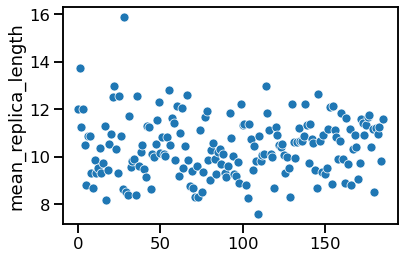

In [329]:
sns.scatterplot(x=df.index, y=df.mean_replica_length)

In [333]:
df.rating.corr(df.mean_replica_length)

-0.056347420569673595

there is no dependency on rating of mean length of replica and it almost constant across episodes, so i will delete this features

In [334]:
df.drop(columns='mean_replica_length', axis=1, inplace=True)

## mean length of words in episode

In [336]:
df['mean_word_length'] = 0

for season in range(1,10):
    episodes = np.sort(script[script.season==season].episode.unique())

    for episode in episodes: 
        text_row = " ".join(word for word in script[(script.season==season)&(script.episode==episode)].text)
        
        text = prepare_text(text_row, stop=True)
        
        length_arr = []
        for word in text:
            length_arr.append(len(word))
        
        mean_length = np.mean(length_arr)
        
        df.loc[(df.season==season) & (df.episode==episode),'mean_word_length'] = mean_length

<AxesSubplot:ylabel='mean_word_length'>

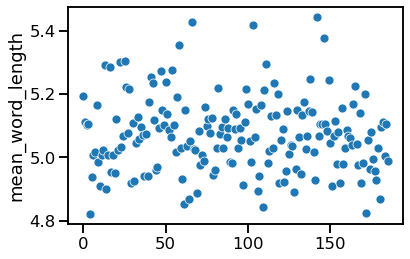

In [337]:
sns.scatterplot(x=df.index, y=df.mean_word_length)

In [338]:
df.rating.corr(df.mean_word_length)

-0.029310431978055076

In [339]:
df.drop(columns='mean_word_length', axis=1, inplace=True)

# count the phrase
'she said', 'michael, no'

In [340]:
df['what_she_said'] = np.nan
# df['no_michael'] = np.nan

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text)
        text = text_row.lower()
        
        df.loc[(df.season==season) & (df.episode==episode), ['what_she_said']] = text.count('what she said')
        
#         no_michael = text.count('michael, no') + text.count('no, michael') 
#         df.loc[(df.season==season) & (df.episode==episode), ['no_michael']] = no_michael

In [341]:
df.what_she_said.sum()

35.0

<AxesSubplot:xlabel='rating', ylabel='what_she_said'>

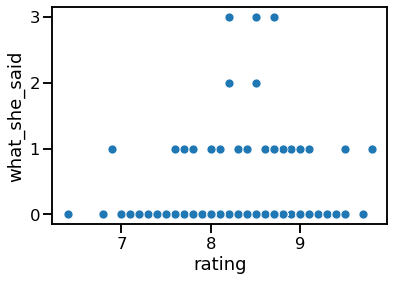

In [342]:
sns.scatterplot(x=df.rating, y=df.what_she_said)

# Count writer notes

In [343]:
pd.set_option('display.max_rows', None) 

In [344]:
all_brackets = []

for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text_w)
        text = text_row.lower()
        
        in_brackets = re.findall("\[.*?\]",text)
        
        for string in in_brackets:
            all_brackets.append(string)

In [345]:
df_brackets = pd.DataFrame(all_brackets)

In [346]:
df_brackets[0].value_counts().sort_values(ascending=False)

[laughs]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [347]:
actions = {'laughs': ['laugh','giggl','chuckl'],
            'singing':['sing','whistl'],
            'applause':['applause','clap'],
            'accent':['accent'],
            'unhappy':['cry','sobbing','groan'],
           'smile':['smile'],
           'sigh':['sigh'],
           'phone':['phone']
          }

In [348]:
for action in actions:
    df[action] = 0
    
for season in range(1,10):
    episodes = np.sort(df[df.season==season].episode.unique())

    for episode in episodes: 
        text_row = ' '.join( word for word in script[(script.season==season) & (script.episode==episode)].text_w)
        text = text_row.lower()
        
        in_brackets = re.findall("\[.*?\]",text)
        
        for string in in_brackets:
            for action in actions:
                if  any( word in string for word in actions[action]):
                    df.loc[(df.season==season) & (df.episode==episode),action] += 1

In [349]:
for action in actions.keys():
    print(action, df[action].sum())

laughs 862
singing 288
applause 150
accent 73
unhappy 121
smile 73
sigh 164
phone 651


In [350]:
df[np.insert(list(actions.keys()), 0, 'rating')].corr().rating.sort_values(ascending=False)

rating      1.000000
unhappy     0.315144
sigh        0.204765
phone       0.113813
smile       0.112644
accent      0.091608
singing     0.036340
laughs      0.023515
applause   -0.014660
Name: rating, dtype: float64

# Save all

In [351]:
df.head()

,season,title,rating,votes,double,episode,month,director,writer,writer_B.J._Novak,...,mean_replica_length,what_she_said,laughs,singing,applause,accent,unhappy,smile,sigh,phone
0,1,Pilot,7.4,7006,0,1,3,Ken Kwapis,Ricky Gervais;Stephen Merchant;Greg Daniels,0,...,16.862403,0.0,5,1,0,0,1,0,1,4
1,1,Diversity Day,8.3,6902,0,2,3,Ken Kwapis,B.J. Novak,1,...,22.183752,0.0,2,0,0,3,1,0,0,2
2,1,Health Care,7.7,5756,0,3,4,Ken Whittingham,Paul Lieberstein,0,...,27.451737,0.0,3,0,1,0,0,0,0,6
3,1,The Alliance,8.0,5579,0,4,4,Bryan Gordon,Michael Schur,0,...,33.017341,0.0,6,1,0,0,0,0,0,2
4,1,Basketball,8.4,6183,0,5,4,Greg Daniels,Greg Daniels,0,...,37.600000,0.0,3,3,2,0,0,0,0,1


In [352]:
df.to_csv('episode_statistics.csv',index=False)